# BePLi v1 YOLO 11 Image Segmentation with Slicing

## Original Dataset Analysis

### Image Size Statistic

In [11]:
import os
from PIL import Image

def get_image_resolutions(directory):
    widths = []
    heights = []
    resolutions = []
    for root, dirs, files in os.walk(directory):
        for file in files:
            if file.lower().endswith(('.png', '.jpg', '.jpeg', '.bmp', '.tiff', '.gif')):
                filepath = os.path.join(root, file)
                try:
                    with Image.open(filepath) as img:
                        width, height = img.size
                        widths.append(width)
                        heights.append(height)
                        resolutions.append(width * height)
                except Exception as e:
                    print(f"Error opening {filepath}: {e}")
    return widths, heights, resolutions

def main():
    directory = "plastic_coco/images"
    if not os.path.exists(directory):
        print(f"Directory {directory} does not exist.")
        return
    
    widths, heights, resolutions = get_image_resolutions(directory)
    if not widths:
        print("No images found.")
        return
    
    min_width = min(widths)
    max_width = max(widths)
    avg_width = sum(widths) / len(widths)
    
    min_height = min(heights)
    max_height = max(heights)
    avg_height = sum(heights) / len(heights)
    
    avg_resolution = sum(resolutions) / len(resolutions)
    below_avg = sum(1 for r in resolutions if r < avg_resolution)
    above_avg = sum(1 for r in resolutions if r > avg_resolution)
    
    print(f"Minimum image resolution: {min_width} x {min_height}")
    print(f"Average image resolution: {avg_width:.2f} x {avg_height:.2f}")
    print(f"Largest image resolution: {max_width} x {max_height}")
    print(f"Images below average resolution ({avg_resolution:.0f} pixels): {below_avg}")
    print(f"Images above average resolution ({avg_resolution:.0f} pixels): {above_avg}")

if __name__ == "__main__":
    main()

Minimum image resolution: 360 x 313
Average image resolution: 852.54 x 635.95
Largest image resolution: 2592 x 1944
Images below average resolution (699705 pixels): 6402
Images above average resolution (699705 pixels): 1050


### COCO JSON Structure

In [2]:
import json

json_file = "plastic_coco/annotation/test.json"

with open(json_file, 'r') as f:
    data = json.load(f)

print("--- TOP LEVEL KEYS ---")
print(list(data.keys()))

print("\n--- SAMPLE IMAGE ENTRY (First Item) ---")
if 'images' in data and len(data['images']) > 0:
    print(json.dumps(data['images'][0], indent=4))
else:
    print("No images found or key is missing.")

print("\n--- SAMPLE ANNOTATION ENTRY (First Item) ---")
if 'annotations' in data and len(data['annotations']) > 0:
    print(json.dumps(data['annotations'][0], indent=4))
else:
    print("No annotations found or key is missing.")

print("\n--- SAMPLE CATEGORY ENTRY (First Item) ---")
if 'categories' in data and len(data['categories']) > 0:
    print(json.dumps(data['categories'][0], indent=4))
else:
    print("No categories found.")

--- TOP LEVEL KEYS ---
['info', 'licenses', 'images', 'annotations', 'categories']

--- SAMPLE IMAGE ENTRY (First Item) ---
{
    "license": 1,
    "file_name": "000001.png",
    "coco_url": "",
    "height": 480,
    "width": 640,
    "date_captured": "",
    "flickr_url": "",
    "id": 1074
}

--- SAMPLE ANNOTATION ENTRY (First Item) ---
{
    "segmentation": {
        "size": [
            480,
            640
        ],
        "counts": "f^]33l>100000O\\Vl5"
    },
    "area": 18,
    "iscrowd": 1,
    "image_id": 1074,
    "bbox": [
        233.0,
        245.0,
        5.0,
        4.0
    ],
    "category_id": 1,
    "id": 38700
}

--- SAMPLE CATEGORY ENTRY (First Item) ---
{
    "supercategory": "plastic_litter",
    "id": 1,
    "name": "plastic_litter"
}


## Downsample Negatives

Unsplash images are highres, large imgsz requires more compute & VRAM, something we don't have.

In [1]:
import os
from PIL import Image
from tqdm import tqdm 

# Configuration
TARGET_SIZE = 640 # max dimension (either width or height)
INPUT_FOLDER = 'beach_negatives'
OUTPUT_FOLDER = 'beach_negatives_downsampled'

# Create output directory
if not os.path.exists(OUTPUT_FOLDER):
    os.makedirs(OUTPUT_FOLDER)
    print(f"Created output folder: {OUTPUT_FOLDER}")

# Get list of .jpg files
files = [f for f in os.listdir(INPUT_FOLDER) if f.lower().endswith('.jpg') or f.lower().endswith('.jpeg')]

print(f"Found {len(files)} images to process...")

# Process images
for filename in tqdm(files, desc="Downsampling images"):
    try:
        input_path = os.path.join(INPUT_FOLDER, filename)
        output_path = os.path.join(OUTPUT_FOLDER, filename)
        
        with Image.open(input_path) as img:
            if max(img.size) > TARGET_SIZE:
                img_resized = img.copy()
                img_resized.thumbnail((TARGET_SIZE, TARGET_SIZE), Image.Resampling.LANCZOS)
                img_resized.save(output_path, quality=90, optimize=True)
            else:
                img.save(output_path, quality=90, optimize=True)
                
    except Exception as e:
        print(f"Error processing {filename}: {e}")

print("Processing complete!")

Found 34 images to process...


Downsampling images: 100%|██████████| 34/34 [00:07<00:00,  4.36it/s]

Processing complete!


## JSON Cleanup + Slicing + COCO to YOLO Conversion

### 1. JSON Cleanup

Involves:
- getting rid of nonstandard keys
- converting RLE to polygon
- getting rid of very small polygons that cause noise & slice failure

In [8]:

# ================= CONFIGURATION =================
RAW_DATA_ROOT = "plastic_coco"
TEMP_JSON_DIR = "plastic_coco/temp_fixed_json"
SLICED_DATA_DIR = "plastic_seg_sliced_coco"
YOLO_OUTPUT_DIR = "plastic_seg_sliced_yolo"
NEGATIVES_DIR = "beach_negatives_downsampled"  # <--- Source of negative images

SLICE_SIZE = 640 
OVERLAP_RATIO = 0.2
MIN_AREA = 480

DATA_SPLITS = [
    ("train", "train.json", "images/train"), 
    ("val",   "val.json",   "images/val"),
    ("test",  "test.json",  "images/test")
]
# =================================================

In [9]:
import json
import os
import shutil
import numpy as np
from shapely.geometry import Polygon, MultiPolygon
from shapely.validation import make_valid
from pycocotools import mask as mask_utils
import cv2
from tqdm import tqdm  # Integrated tqdm

def rle_to_polygon(segmentation, height, width):
    """ Converts RLE to Polygon (OpenCV Style). """
    try:
        if isinstance(segmentation, dict) and isinstance(segmentation.get('counts'), str):
            segmentation['counts'] = segmentation['counts'].encode('utf-8')
            binary_mask = mask_utils.decode([segmentation])[:, :, 0]
        elif isinstance(segmentation, dict) and isinstance(segmentation.get('counts'), list):
            rle = mask_utils.frPyObjects(segmentation, height, width)
            binary_mask = mask_utils.decode(rle)
        elif isinstance(segmentation, list):
            rle = mask_utils.frPyObjects(segmentation, height, width)
            binary_mask = mask_utils.decode(rle)
        else:
            return []

        contours, _ = cv2.findContours(binary_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
        polygons = []
        for contour in contours:
            if contour.size >= 6: 
                polygons.append(contour.flatten().tolist())
        return polygons
    except Exception:
        return []

def fix_polygon_geometry(poly):
    """ Magic fix for broken polygons. """
    if not poly.is_valid:
        poly = make_valid(poly)
    
    poly = poly.buffer(0)
    
    if isinstance(poly, MultiPolygon):
        if len(poly.geoms) > 0:
            poly = max(poly.geoms, key=lambda p: p.area)
        else:
            return None
            
    if poly.is_empty or poly.area < MIN_AREA:
        return None
        
    return poly

def scorched_earth_cleaning(annotations):
    clean_anns = []
    fixed_coords = 0
    purged_anns = 0  # Counter for objects deleted due to missing segments
    dropped_small = 0 
    
    # Integrated tqdm here for cleaning process
    for ann in tqdm(annotations, desc="    - Cleaning & Repairing", unit="ann"):
        # 1. Sanitize BBox
        if 'bbox' in ann:
            x, y, w, h = ann['bbox']
            if w < 2: w = 2
            if h < 2: h = 2
            ann['bbox'] = [x, y, w, h]
            bbox_area = w * h
        else:
            continue

        # 2. Fix Segmentation
        valid_seg = False
        final_area = bbox_area 
        
        if 'segmentation' in ann and isinstance(ann['segmentation'], list) and len(ann['segmentation']) > 0:
            try:
                raw_coords = ann['segmentation'][0]
                # Check for at least 3 points (6 coords)
                if len(raw_coords) >= 6:
                    pts = np.array(raw_coords).reshape(-1, 2)
                    shapely_poly = Polygon(pts)
                    
                    clean_poly = fix_polygon_geometry(shapely_poly)
                    
                    if clean_poly is not None:
                        new_coords = np.array(clean_poly.exterior.coords).flatten().tolist()
                        ann['segmentation'] = [new_coords]
                        final_area = clean_poly.area
                        valid_seg = True
                        fixed_coords += 1
            except Exception:
                valid_seg = False

        # 3. GLOBAL SIZE CHECK 
        if final_area < MIN_AREA:
            dropped_small += 1
            continue 

        # 4. Finalize Structure (STRICT MODE)
        if valid_seg:
            ann['area'] = final_area
            ann['iscrowd'] = 0
            clean_anns.append(ann)
        else:
            # --- STRICT DELETION ---
            # If valid_seg is False, we completely ignore this annotation.
            # We do NOT append it to clean_anns.
            purged_anns += 1
            continue

    print(f"    - Scorched Earth Report:")
    print(f"      FIXED: {fixed_coords} polygons (geometry repaired)")
    print(f"      DROPPED: {dropped_small} objects (area < {MIN_AREA})")
    print(f"      PURGED: {purged_anns} objects removed (No valid segmentation found)")
    return clean_anns

def inject_negatives(data, target_img_folder):
    """
    Copies images from NEGATIVES_DIR to target_img_folder.
    Adds them to the COCO JSON 'images' list.
    Does NOT add to 'annotations' list (Standard COCO way to define negatives).
    """
    if not os.path.exists(NEGATIVES_DIR):
        print(f"    ! Warning: Negative directory '{NEGATIVES_DIR}' not found. Skipping.")
        return data

    print(f"    + Injecting negatives from: {NEGATIVES_DIR}")
    
    # Calculate starting ID to avoid conflicts
    current_ids = [img['id'] for img in data['images']]
    next_id = (max(current_ids) + 1) if current_ids else 1
    
    neg_files = [f for f in os.listdir(NEGATIVES_DIR) if f.lower().endswith(('.jpg', '.jpeg', '.png'))]
    added_count = 0

    # Integrated tqdm here for file copying
    for fname in tqdm(neg_files, desc="    - Processing Negatives", unit="img"):
        src_path = os.path.join(NEGATIVES_DIR, fname)
        dst_path = os.path.join(target_img_folder, fname)
        
        # 1. Copy Image File
        try:
            shutil.copy2(src_path, dst_path)
        except Exception as e:
            print(f"      Error copying {fname}: {e}")
            continue

        # 2. Get Dimensions
        img = cv2.imread(src_path)
        if img is None:
            print(f"      Error reading {fname}, skipping.")
            continue
        h, w = img.shape[:2]

        # 3. Add to JSON 'images' list
        data['images'].append({
            "id": next_id,
            "file_name": fname, # Assumes flat directory structure in images/train
            "width": w,
            "height": h,
            "license": 0,
            "date_captured": ""
        })
        
        next_id += 1
        added_count += 1
        
    print(f"      Successfully added {added_count} negative images (Background only).")
    return data

def fix_json_phase1(split_name, json_filename, relative_img_path):
    """ Phase 1: RLE -> Scorched Earth Fix -> Inject Negatives -> Save """
    input_json = os.path.join(RAW_DATA_ROOT, "annotation", json_filename)
    output_json = os.path.join(TEMP_JSON_DIR, json_filename)
    
    print(f"Fixing JSON for {split_name.upper()}...")
    with open(input_json, 'r') as f:
        data = json.load(f)

    # --- NEW: Inject Negatives (Train Only) ---
    if split_name == "train":
        full_train_img_path = os.path.join(RAW_DATA_ROOT, relative_img_path)
        # Ensure directory exists before copying
        os.makedirs(full_train_img_path, exist_ok=True) 
        data = inject_negatives(data, full_train_img_path)
    # ------------------------------------------

    img_dims = {img['id']: (img['height'], img['width']) for img in data['images']}
    processed_anns = []

    # Step A: RLE Conversion
    # Integrated tqdm here for RLE conversion loop
    for ann in tqdm(data['annotations'], desc="    - RLE Conversion", unit="ann"):
        if ann['image_id'] not in img_dims: continue
        
        if 'segmentation' in ann and isinstance(ann['segmentation'], dict) and 'counts' in ann['segmentation']:
            polygons = rle_to_polygon(ann['segmentation'], *img_dims[ann['image_id']])
            if polygons:
                ann['segmentation'] = polygons
                processed_anns.append(ann)
        else:
            processed_anns.append(ann)

    # Step B: Scorched Earth Cleaning
    data['annotations'] = scorched_earth_cleaning(processed_anns)
    
    os.makedirs(os.path.dirname(output_json), exist_ok=True)
    with open(output_json, 'w') as f:
        json.dump(data, f)
    
    return output_json

# ================= EXECUTION =================

if os.path.exists(YOLO_OUTPUT_DIR): shutil.rmtree(YOLO_OUTPUT_DIR)
if os.path.exists(TEMP_JSON_DIR): shutil.rmtree(TEMP_JSON_DIR)

# --- PHASE 1 ---
for split, json_file, src_folder in DATA_SPLITS:
    # Updated to pass src_folder (e.g., "images/train")
    fixed_json_path = fix_json_phase1(split, json_file, src_folder)

Fixing JSON for TRAIN...
    + Injecting negatives from: beach_negatives_downsampled


    - Processing Negatives: 100%|██████████| 34/34 [00:00<00:00, 754.75img/s]


      Successfully added 34 negative images (Background only).


    - Cleaning & Repairing: 100%|██████████| 73721/73721 [00:06<00:00, 11130.29ann/s]


    - Scorched Earth Report:
      FIXED: 8202 polygons (geometry repaired)
      DROPPED: 58866 objects (area < 480)
      PURGED: 6653 objects removed (No valid segmentation found)
Fixing JSON for VAL...


    - Cleaning & Repairing: 100%|██████████| 22960/22960 [00:01<00:00, 11915.48ann/s]


    - Scorched Earth Report:
      FIXED: 2491 polygons (geometry repaired)
      DROPPED: 18411 objects (area < 480)
      PURGED: 2058 objects removed (No valid segmentation found)
Fixing JSON for TEST...


    - Cleaning & Repairing: 100%|██████████| 22268/22268 [00:01<00:00, 14317.60ann/s]


    - Scorched Earth Report:
      FIXED: 2733 polygons (geometry repaired)
      DROPPED: 17514 objects (area < 480)
      PURGED: 2021 objects removed (No valid segmentation found)


### 2. Slicing

Use sahi to slice image to uniform size

In [10]:
from sahi.slicing import slice_coco
import os

def slice_dataset(split_name, json_path, src_folder_name):
    """ Phase 2: Slice """
    image_dir = os.path.join(RAW_DATA_ROOT, src_folder_name)
    output_dir = os.path.join(SLICED_DATA_DIR, 'images', split_name)
    
    print(f"Slicing {split_name.upper()}...")
    
    coco_dict, result_path = slice_coco(
        coco_annotation_file_path=json_path,
        image_dir=image_dir,
        output_coco_annotation_file_name=split_name,
        output_dir=output_dir,
        slice_height=SLICE_SIZE,
        slice_width=SLICE_SIZE,
        overlap_height_ratio=OVERLAP_RATIO,
        overlap_width_ratio=OVERLAP_RATIO,
        min_area_ratio=0.1, 
        verbose=False 
    )

    return result_path, output_dir


sliced_json_paths = [] 

for split, json_file, src_folder in DATA_SPLITS:
    fixed_json_path = os.path.join(TEMP_JSON_DIR, json_file)
    sliced_json_path, sliced_img_dir = slice_dataset(split, fixed_json_path, src_folder)
    sliced_json_paths.append((split, sliced_json_path, sliced_img_dir))


Slicing TRAIN...


100%|██████████| 2260/2260 [01:37<00:00, 23.17it/s]


Slicing VAL...


100%|██████████| 742/742 [00:30<00:00, 24.26it/s]


Slicing TEST...


100%|██████████| 741/741 [00:33<00:00, 22.09it/s]


In [11]:
from pathlib import Path
import shutil

for split, json_path, _ in sliced_json_paths:
    new_name = json_path.stem.replace("_coco", "") + json_path.suffix
    destination = Path(f"{SLICED_DATA_DIR}/annotated") / new_name

    destination.parent.mkdir(parents=True, exist_ok=True)
    shutil.move(json_path, destination)

    print(f"Moved {json_path} -> {destination}")


Moved plastic_seg_sliced_coco/images/train/train_coco.json -> plastic_seg_sliced_coco/annotated/train.json
Moved plastic_seg_sliced_coco/images/val/val_coco.json -> plastic_seg_sliced_coco/annotated/val.json
Moved plastic_seg_sliced_coco/images/test/test_coco.json -> plastic_seg_sliced_coco/annotated/test.json


### 3. Convert Sliced COCO JSON to YOLO txt

In [12]:
# --- PHASE 3 ---

from ultralytics.data.converter import convert_coco

print("\n--- PHASE 3: Generating YOLO Labels ---")

convert_coco(
    labels_dir=os.path.join(SLICED_DATA_DIR, "annotated"),
    save_dir=YOLO_OUTPUT_DIR,
    use_segments=True,
    use_keypoints=False,
)



--- PHASE 3: Generating YOLO Labels ---
Annotations /home/kris/Documents/projects/ai-plastic-spotter/train/plastic_seg_sliced_coco/annotated/test.json: 100% ━━━━━━━━━━━━ 1244/1244 4.0Kit/s 0.3s0.0s
Annotations /home/kris/Documents/projects/ai-plastic-spotter/train/plastic_seg_sliced_coco/annotated/train.json: 100% ━━━━━━━━━━━━ 3783/3783 2.4Kit/s 1.6s0.1s
Annotations /home/kris/Documents/projects/ai-plastic-spotter/train/plastic_seg_sliced_coco/annotated/val.json: 100% ━━━━━━━━━━━━ 1224/1224 3.7Kit/s 0.3s0.1s
COCO data converted successfully.
Results saved to /home/kris/Documents/projects/ai-plastic-spotter/train/plastic_seg_sliced_yolo


In [13]:
# --- PHASE 3.5: Fix Missing Empty Labels ---
import os
import glob
from pathlib import Path

def generate_missing_empty_labels(images_dir, labels_dir):
    # 1. Get all image files (jpg, png, jpeg, etc.)
    # Adjust extensions if you use different formats
    image_extensions = ['*.jpg', '*.jpeg', '*.png', '*.bmp']
    image_files = []
    for ext in image_extensions:
        image_files.extend(glob.glob(os.path.join(images_dir, ext)))

    print(f"Checking {len(image_files)} images for missing labels...")
    
    created_count = 0
    
    for img_path in image_files:
        # Get the filename without extension (e.g., "slice_01")
        stem = Path(img_path).stem
        
        # Construct expected label path
        label_path = os.path.join(labels_dir, f"{stem}.txt")
        
        # 2. If label file doesn't exist, create it (empty)
        if not os.path.exists(label_path):
            with open(label_path, 'w') as f:
                pass # Create empty file
            created_count += 1

    print(f"--- Fix Complete: Created {created_count} empty label files for background images. ---")

for split, _, _ in DATA_SPLITS:
    print(f"\nProcessing split: {split.upper()}")
    # Define where your actual images and the new labels are located
    # You need to point this to the folder containing the IMAGES corresponding to the labels
    # Assuming standard YOLO structure or your sliced directory:
    imgs_path = os.path.join(SLICED_DATA_DIR, "images", split) # Update this path if your images are elsewhere
    lbls_path = os.path.join(YOLO_OUTPUT_DIR, "labels", split) # default output of convert_coco is often inside a 'labels' subdir

    # Run the fix
    generate_missing_empty_labels(imgs_path, lbls_path)


Processing split: TRAIN
Checking 6933 images for missing labels...
--- Fix Complete: Created 3150 empty label files for background images. ---

Processing split: VAL
Checking 2269 images for missing labels...
--- Fix Complete: Created 1045 empty label files for background images. ---

Processing split: TEST
Checking 2487 images for missing labels...
--- Fix Complete: Created 1243 empty label files for background images. ---


### 4. Symlink Original Sliced Image to YOLO Folder

Symlink: plastic_sliced_yolo/images/* -> plastic_sliced_coco/images/*

In [14]:

# 4. Link Images

def safe_symlink(split_name, src_subfolder):
    """ 
    Creates a relative symlink.
    Checks if source exists FIRST to prevent broken 'file-like' links.
    """
    # 1. Define paths
    # The actual physical location of the images
    target_abs_path = os.path.abspath(src_subfolder)
    
    # Where we want the link to be
    link_parent = os.path.join(YOLO_OUTPUT_DIR, "images")
    link_path = os.path.join(link_parent, split_name)

    # 2. VALIDATION: Does the source actually exist?
    if not os.path.exists(target_abs_path):
        print(f"  [CRITICAL ERROR] Cannot link '{split_name}'. Source folder not found:")
        print(f"    -> {target_abs_path}")
        print(f"    -> Check 'DATA_SPLITS' config at top of script.")
        return

    # 3. Cleanup existing links
    os.makedirs(link_parent, exist_ok=True)
    if os.path.lexists(link_path): # lexists returns True even for broken links
        if os.path.islink(link_path) or os.path.isfile(link_path):
            os.unlink(link_path)
        else:
            shutil.rmtree(link_path)

    # 4. Create RELATIVE Symlink (More robust in WSL)
    # This creates a link pointing to e.g. "../../../plastic_coco/images/train"
    rel_source = os.path.relpath(target_abs_path, start=link_parent)
    
    print(f"Linking: {link_path} -> {rel_source}")
    try:
        os.symlink(rel_source, link_path)
    except OSError as e:
        print(f"  [Error] Failed to create symlink: {e}")


print("\n--- PHASE 4: Linking Image Folders ---")
for split, _, src_folder in sliced_json_paths:
    safe_symlink(split, src_folder)

print("\nDONE.")


--- PHASE 4: Linking Image Folders ---
Linking: plastic_seg_sliced_yolo/images/train -> ../../plastic_seg_sliced_coco/images/train
Linking: plastic_seg_sliced_yolo/images/val -> ../../plastic_seg_sliced_coco/images/val
Linking: plastic_seg_sliced_yolo/images/test -> ../../plastic_seg_sliced_coco/images/test

DONE.


In [16]:
import os
import glob
import cv2
import numpy as np
from tqdm.notebook import tqdm

# ================= CONFIGURATION =================
# Path to your dataset root
DATA_ROOT = 'plastic_seg_sliced_yolo' 

# Minimum area in PIXELS to keep a label
# Example: A 10x10 pixel object has an area of 100.
# MIN_AREA = 200  

# Subsets to process
SUBSETS = ['train', 'val', 'test']
# =================================================

def calculate_polygon_area(coords):
    """
    Calculates the area of a polygon using the Shoelace formula.
    coords: Numpy array of shape (N, 2) containing [x, y] coordinates.
    """
    x = coords[:, 0]
    y = coords[:, 1]
    return 0.5 * np.abs(np.dot(x, np.roll(y, 1)) - np.dot(y, np.roll(x, 1)))

def filter_labels():
    total_labels = 0
    dropped_labels = 0
    
    print(f"Starting filtering process. Min Area Threshold: {MIN_AREA} pixels.")

    for subset in SUBSETS:
        label_dir = os.path.join(DATA_ROOT, 'labels', subset)
        image_dir = os.path.join(DATA_ROOT, 'images', subset)
        
        # Get all text files in the label directory
        label_files = glob.glob(os.path.join(label_dir, '*.txt'))
        
        print(f"\nProcessing {subset}: Found {len(label_files)} label files.")
        
        for label_path in tqdm(label_files, desc=f"Filtering {subset}"):
            # Derive corresponding image path
            filename = os.path.basename(label_path)
            image_name = filename.replace('.txt', '.png')
            image_path = os.path.join(image_dir, image_name)
            
            # Check if image exists
            if not os.path.exists(image_path):
                # Try jpg just in case, otherwise skip
                image_path = image_path.replace('.png', '.jpg')
                if not os.path.exists(image_path):
                    print(f"Warning: Image not found for {label_path}, skipping...")
                    continue
            
            # Read image to get dimensions
            img = cv2.imread(image_path)
            if img is None:
                print(f"Warning: Could not read image {image_path}, skipping...")
                continue
                
            h_img, w_img, _ = img.shape
            
            # Read labels
            with open(label_path, 'r') as f:
                lines = f.readlines()
            
            new_lines = []
            
            for line in lines:
                parts = line.strip().split()
                if not parts: continue
                
                class_id = parts[0]
                coords = np.array([float(x) for x in parts[1:]])
                
                total_labels += 1
                area_pixel = 0
                
                # Check format: BBox (5 values total) or Segmentation (>5 values)
                if len(parts) == 5:
                    # YOLO BBox format: class x_center y_center width height
                    # dimensions are normalized 0-1
                    norm_w = coords[2]
                    norm_h = coords[3]
                    
                    pixel_w = norm_w * w_img
                    pixel_h = norm_h * h_img
                    area_pixel = pixel_w * pixel_h
                    
                elif len(parts) > 5:
                    # YOLO Segmentation format: class x1 y1 x2 y2 ...
                    # Reshape into [[x1, y1], [x2, y2], ...]
                    poly_coords = coords.reshape(-1, 2)
                    
                    # Denormalize coordinates
                    poly_coords[:, 0] *= w_img
                    poly_coords[:, 1] *= h_img
                    
                    area_pixel = calculate_polygon_area(poly_coords)
                
                # Filter Logic
                if area_pixel >= MIN_AREA:
                    new_lines.append(line)
                else:
                    dropped_labels += 1

            # Overwrite the label file with filtered lines
            # If all labels are dropped, this creates an empty file (valid in YOLO)
            with open(label_path, 'w') as f:
                f.writelines(new_lines)

    print("-" * 30)
    print("Process Complete.")
    print(f"Total Labels Scanned: {total_labels}")
    print(f"Labels Dropped (<{MIN_AREA}px): {dropped_labels}")
    print(f"Labels Kept: {total_labels - dropped_labels}")

# Run the function
filter_labels()

Starting filtering process. Min Area Threshold: 480 pixels.

Processing train: Found 6933 label files.


Filtering train:   0%|          | 0/6933 [00:00<?, ?it/s]


Processing val: Found 2269 label files.


Filtering val:   0%|          | 0/2269 [00:00<?, ?it/s]


Processing test: Found 2487 label files.


Filtering test:   0%|          | 0/2487 [00:00<?, ?it/s]

------------------------------
Process Complete.
Total Labels Scanned: 27103
Labels Dropped (<480px): 829
Labels Kept: 26274



## Compressing Sliced YOLO Dataset

One might need to compress to save time copying files to cloud GPU.



For compressing this with tar use the `-h` flag:

> tar `-h` flag: 
> *When reading or writing a file to be archived, tar accesses the file that a symbolic link points to, rather than the symlink itself.*

**tar + gunzip**

```sh
tar -hczf plastic_sliced_yolo.tar.gz plastic_sliced_yolo/
```

Extract:

```sh
tar -xzf plastic_sliced_yolo.tar.gz
```

**tar + pigz**

`pigz` is a multithreaded gunzip implementation. Useful if you need faster gunzip compression. Requires `pigz` to be installed.

```sh
tar --use-compress-program=pigz -hcf plastic_sliced_yolo.tar.gz plastic_sliced_yolo/
```

You extract it like you would extract `.tar.gz` file.

**tar + zstd**

`zstd` is a fast modern compression format. Not compatible with gunzip. Requires `zstd` to be installed. It is as fast/faster than `pigz` for less load.

```sh
tar --zstd -hcf plastic_sliced_yolo.tar.zst plastic_sliced_yolo/
```

Extract:

```sh
tar --zstd -xf plastic_sliced_yolo.tar.zst
```


## Inspecting Anomalous Polygons

Scanning 11689 label files...
Found Smallest Object!
File: plastic_seg_sliced_yolo/images/test/000639_638_0_512_640_1152.png
Area (Normalized): 0.00117187
Area (Pixels): 480.0000 px²
Type: Segmentation Polygon


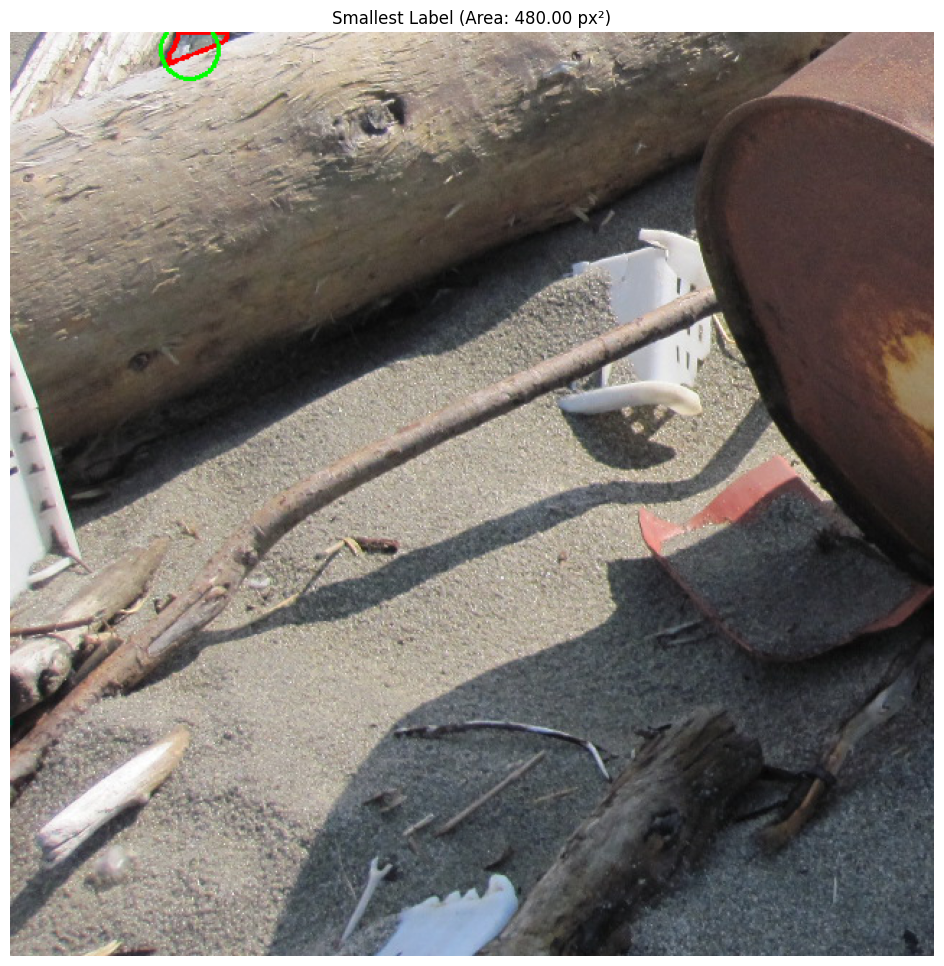

In [17]:
import os
import glob
import cv2
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path

# ================= Configuration =================
DATASET_ROOT = 'plastic_seg_sliced_yolo'
IMAGE_EXTENSIONS = {'.jpg', '.jpeg', '.png', '.bmp'}
# =================================================

def calculate_polygon_area(coords):
    """
    Calculates the area of a polygon using the Shoelace formula (Normalized).
    """
    if len(coords) < 6: 
        return 0.0
    points = np.array(coords).reshape(-1, 2)
    x = points[:, 0]
    y = points[:, 1]
    return 0.5 * np.abs(np.dot(x, np.roll(y, 1)) - np.dot(y, np.roll(x, 1)))

def calculate_bbox_area(coords):
    """
    Calculates area for a standard YOLO bbox (Normalized).
    """
    return coords[2] * coords[3]

def find_smallest_label(root_path):
    min_area = float('inf')
    smallest_item = None
    
    # Search recursively for all .txt files in the labels folder
    label_search_path = os.path.join(root_path, 'labels', '*', '*.txt')
    label_files = glob.glob(label_search_path)
    
    print(f"Scanning {len(label_files)} label files...")
    
    for label_file in label_files:
        try:
            with open(label_file, 'r') as f:
                lines = f.readlines()
                
            for i, line in enumerate(lines):
                parts = list(map(float, line.strip().split()))
                if len(parts) < 5: continue
                
                class_id = int(parts[0])
                coords = parts[1:]
                
                # Check format
                if len(coords) == 4:
                    area = calculate_bbox_area(coords) # BBox
                    is_segmentation = False
                else:
                    area = calculate_polygon_area(coords) # Segmentation
                    is_segmentation = True
                
                if area > 0 and area < min_area:
                    min_area = area
                    smallest_item = {
                        'label_path': label_file,
                        'line_index': i,
                        'area': area, # Normalized area
                        'class_id': class_id,
                        'coords': coords,
                        'is_segmentation': is_segmentation
                    }
        except Exception as e:
            print(f"Error reading {label_file}: {e}")
            
    return smallest_item

def visualize_smallest(item, root_path):
    if not item:
        print("No labels found!")
        return

    # Construct image path from label path
    label_path = Path(item['label_path'])
    split_folder = label_path.parent.name # e.g., 'train', 'test'
    filename_stem = label_path.stem
    
    image_dir = os.path.join(root_path, 'images', split_folder)
    
    # Find matching image
    image_path = None
    for ext in IMAGE_EXTENSIONS:
        temp_path = os.path.join(image_dir, filename_stem + ext)
        if os.path.exists(temp_path):
            image_path = temp_path
            break
            
    if not image_path:
        print(f"Could not find image for label: {label_path}")
        return

    # Load Image
    img = cv2.imread(image_path)
    if img is None:
        print(f"Failed to load image: {image_path}")
        return
        
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    h, w, _ = img.shape
    
    # --- Calculate Pixel Area ---
    pixel_area = item['area'] * w * h
    
    print(f"Found Smallest Object!")
    print(f"File: {image_path}")
    print(f"Area (Normalized): {item['area']:.8f}")
    print(f"Area (Pixels): {pixel_area:.4f} px²") # <--- Added Print
    print(f"Type: {'Segmentation Polygon' if item['is_segmentation'] else 'Bounding Box'}")

    # Prepare drawing
    coords = item['coords']
    color = (255, 0, 0)
    thickness = 2
    
    if item['is_segmentation']:
        # Denormalize points
        points = np.array(coords).reshape(-1, 2)
        points[:, 0] *= w
        points[:, 1] *= h
        points = points.astype(np.int32)
        
        cv2.polylines(img, [points], isClosed=True, color=color, thickness=thickness)
        
        center_x = int(np.mean(points[:, 0]))
        center_y = int(np.mean(points[:, 1]))
        
    else:
        # Denormalize BBox
        bw = coords[2] * w
        bh = coords[3] * h
        bx = (coords[0] * w) - (bw / 2)
        by = (coords[1] * h) - (bh / 2)
        
        p1 = (int(bx), int(by))
        p2 = (int(bx + bw), int(by + bh))
        
        cv2.rectangle(img, p1, p2, color, thickness)
        
        center_x = int(bx + bw/2)
        center_y = int(by + bh/2)

    # Marker
    cv2.circle(img, (center_x, center_y), 20, (0, 255, 0), 2)
    
    plt.figure(figsize=(12, 12))
    plt.imshow(img)
    plt.axis('off')
    plt.title(f"Smallest Label (Area: {pixel_area:.2f} px²)")
    plt.show()

# ================= Execution =================
if __name__ == "__main__":
    if os.path.exists(DATASET_ROOT):
        result = find_smallest_label(DATASET_ROOT)
        visualize_smallest(result, DATASET_ROOT)
    else:
        print(f"Directory '{DATASET_ROOT}' not found.")

Found 5 objects.


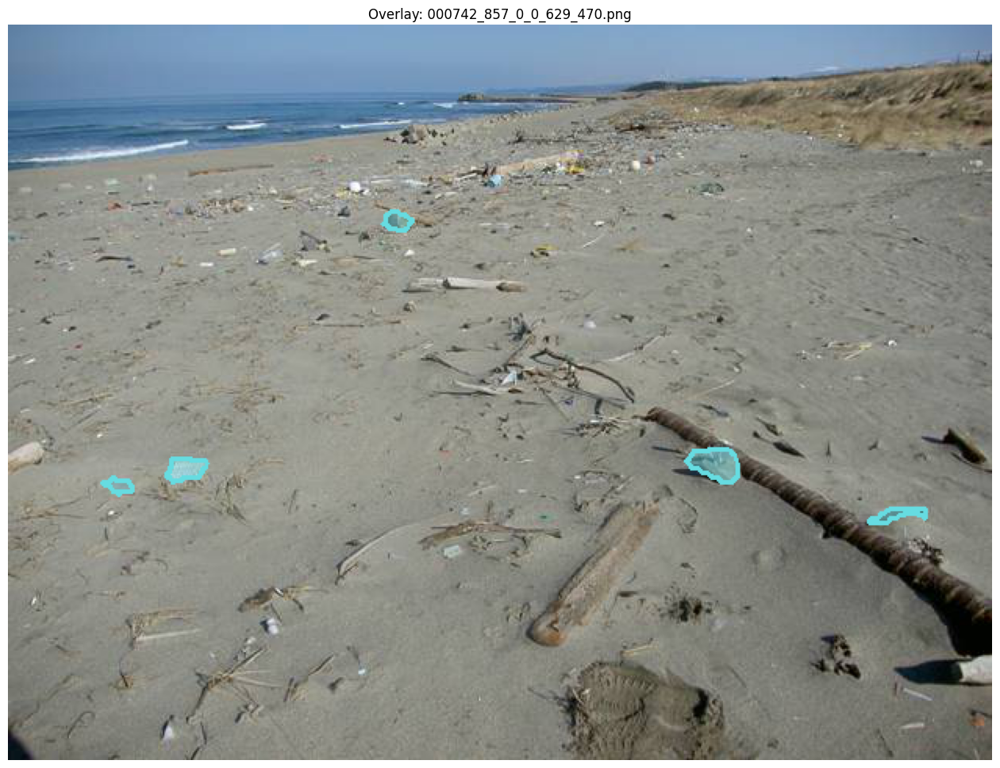

In [15]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os

def visualize_yolo_jupyter(image_path, label_path, figsize=(16, 16), alpha=0.4):
    """
    Visualizes YOLO segmentation on an existing image in Jupyter.
    
    Args:
        image_path (str): Path to the .jpg/.png image.
        label_path (str): Path to the .txt file with segmentation data.
        figsize (tuple): Size of the matplotlib plot (increase for small objects).
        alpha (float): Transparency of the mask (0.0 to 1.0).
    """
    
    # 1. Load and Validate Image
    if not os.path.exists(image_path):
        print(f"Error: Image not found at {image_path}")
        return
    
    # Load Image (BGR -> RGB)
    img = cv2.imread(image_path)
    if img is None:
        print("Error: Could not read image file.")
        return
    
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    h, w, _ = img.shape
    
    # 2. Read Label File
    lines = []
    if os.path.exists(label_path):
        with open(label_path, 'r') as f:
            lines = f.readlines()
    else:
        print(f"Warning: Label file not found at {label_path}")

    # Generate consistent random colors for classes
    np.random.seed(42) 
    colors = np.random.randint(0, 255, size=(100, 3), dtype=np.uint8)

    print(f"Found {len(lines)} objects.")

    # 3. Draw Polygons
    for line in lines:
        data = line.strip().split()
        if len(data) < 3: continue # Skip invalid lines

        class_id = int(data[0])
        
        # Parse normalized coordinates
        coords = np.array([float(x) for x in data[1:]])
        
        # Reshape to (N, 2)
        poly_coords = coords.reshape(-1, 2)
        
        # Denormalize (Scale to image dimensions)
        poly_coords[:, 0] *= w
        poly_coords[:, 1] *= h
        
        # Convert to int32 for OpenCV
        poly_coords = poly_coords.astype(np.int32)
        pts = poly_coords.reshape((-1, 1, 2))

        # Get Color
        color = [int(c) for c in colors[class_id]] # RGB

        # A. Draw Semi-Transparent Fill
        overlay = img_rgb.copy()
        cv2.fillPoly(overlay, [pts], color)
        img_rgb = cv2.addWeighted(overlay, alpha, img_rgb, 1 - alpha, 0)
        
        # B. Draw Border (Crucial for small objects to see edges)
        # Thickness 1 or 2 is usually best for small objects
        cv2.polylines(img_rgb, [pts], isClosed=True, color=color, thickness=2)

    # 4. Plot
    plt.figure(figsize=figsize)
    plt.imshow(img_rgb)
    plt.axis('off')
    plt.title(f"Overlay: {os.path.basename(image_path)}")
    plt.show()

# ==========================================
# PASTE YOUR PATHS BELOW
# ==========================================

# Example: "dataset/images/train/img_001.jpg"
img_path = f"{YOLO_OUTPUT_DIR}/images/train/000742_857_0_0_629_470.png" 

# Example: "dataset/labels/train/img_001.txt"
txt_path = f"{YOLO_OUTPUT_DIR}/labels/train/000742_857_0_0_629_470.txt" 

visualize_yolo_jupyter(img_path, txt_path)

In [16]:
import json

# Path to your RAW train.json
json_path = f"{TEMP_JSON_DIR}/train.json"

with open(json_path, 'r') as f:
    data = json.load(f)

# 1. Get the 187th Image (Index 186)
# Note: SAHI iterates images in the order they appear in 'images' list
if len(data['images']) > 186:
    target_img = data['images'][186]
    print(f"--- SUSPECT IMAGE (Index 186) ---")
    print(f"ID: {target_img['id']}")
    print(f"File: {target_img['file_name']}")
    print(f"Dims: {target_img['width']}x{target_img['height']}")
    
    # 2. Find annotations for this image
    anns = [a for a in data['annotations'] if a['image_id'] == target_img['id']]
    print(f"Found {len(anns)} annotations.")
    
    # 3. Inspect them
    for i, ann in enumerate(anns):
        print(ann)
        print(f"\n[Annotation {i}] ID: {ann['id']}")
        print(f"  - BBox: {ann.get('bbox')}")
        print(f"  - Area (in JSON): {ann.get('area')}")
        print(f"  - Iscrowd: {ann.get('iscrowd')}")
        
        # Check Segmentation
        seg = ann.get('segmentation')
        if not seg:
            print("  - Segmentation: NONE/EMPTY")
        elif isinstance(seg, dict):
             print(f"  - Segmentation: RLE (Counts len: {len(seg.get('counts', ''))})")
        elif isinstance(seg, list):
             # Check if it looks like a line
             points = len(seg[0]) if len(seg) > 0 else 0
             print(f"  - Segmentation: POLYGON (Points: {points})")
             if points < 6:
                 print("    [WARNING] Polygon has < 3 points (Invalid!)")
else:
    print("Dataset has fewer than 186 images.")

--- SUSPECT IMAGE (Index 186) ---
ID: 3696
File: 001163.png
Dims: 1600x1200
Found 16 annotations.
{'segmentation': [[1553.0, 648.0, 1551.0, 650.0, 1551.0, 651.0, 1548.0, 654.0, 1548.0, 655.0, 1547.0, 656.0, 1547.0, 660.0, 1546.0, 661.0, 1546.0, 674.0, 1561.0, 689.0, 1563.0, 689.0, 1564.0, 690.0, 1565.0, 690.0, 1566.0, 691.0, 1567.0, 691.0, 1568.0, 692.0, 1569.0, 692.0, 1570.0, 693.0, 1572.0, 693.0, 1573.0, 694.0, 1574.0, 694.0, 1575.0, 695.0, 1576.0, 695.0, 1577.0, 696.0, 1579.0, 696.0, 1580.0, 697.0, 1581.0, 697.0, 1582.0, 698.0, 1583.0, 698.0, 1584.0, 699.0, 1586.0, 699.0, 1587.0, 700.0, 1588.0, 700.0, 1589.0, 701.0, 1590.0, 701.0, 1592.0, 703.0, 1593.0, 703.0, 1594.0, 704.0, 1595.0, 704.0, 1597.0, 706.0, 1598.0, 706.0, 1599.0, 707.0, 1599.0, 652.0, 1595.0, 652.0, 1594.0, 653.0, 1587.0, 653.0, 1586.0, 652.0, 1583.0, 652.0, 1582.0, 651.0, 1578.0, 651.0, 1577.0, 650.0, 1572.0, 650.0, 1571.0, 649.0, 1566.0, 649.0, 1565.0, 648.0, 1553.0, 648.0]], 'area': 2225.0, 'iscrowd': 0, 'image_id':

In [17]:
import os
from pathlib import Path

# ================= CONFIGURATION =================
# Replace this with the path to your labels folder
TARGET_DIRS = [f"{YOLO_OUTPUT_DIR}/labels/train", f"{YOLO_OUTPUT_DIR}/labels/val", f"{YOLO_OUTPUT_DIR}/labels/test"]
# =================================================

def scan_labels(directory):
    path = Path(directory)
    
    # Check if directory exists
    if not path.exists():
        print(f"❌ Error: The directory '{directory}' does not exist.")
        print("   Please check the TARGET_DIR path.")
        return

    # Find all .txt files recursively (looks inside subfolders too)
    all_txt_files = list(path.rglob("*.txt"))
    total_files = len(all_txt_files)
    
    empty_files = []
    non_empty_count = 0
    
    print(f"📂 Scanning {total_files} label files in: {path.absolute()}...\n")

    for file_path in all_txt_files:
        try:
            with open(file_path, 'r', encoding='utf-8') as f:
                # .strip() removes spaces/newlines. 
                # If content becomes "", the file is effectively empty to YOLO.
                content = f.read().strip()
                
                if not content:
                    empty_files.append(file_path.name)
                else:
                    non_empty_count += 1
                    
        except Exception as e:
            print(f"⚠️ Could not read file {file_path.name}: {e}")

    # --- DISPLAY RESULTS ---
    empty_count = len(empty_files)
    
    print("="*40)
    print("           SCAN RESULTS           ")
    print("="*40)
    print(f"Total .txt Files:      {total_files}")
    print(f"✅ Non-Empty (Objects): {non_empty_count}")
    print(f"🈳 Empty (Background):  {empty_count}")
    
    if total_files > 0:
        percent = (empty_count / total_files) * 100
        print(f"📊 Background Ratio:    {percent:.2f}%")
        
        # --- INTELLIGENT ADVICE ---
        print("-" * 40)
        if percent == 0:
            print("🚨 CRITICAL: You have 0% negative samples.")
            print("   Action: Add ~50-100 empty .txt files to fix false positives.")
        elif percent < 1.0:
            print("⚠️ WARNING: Very low background ratio (<1%).")
            print("   Your model might still hallucinate objects.")
        elif 1.0 <= percent <= 10.0:
            print("✅ GOOD: You have a healthy mix of negative samples.")
        else:
            print("ℹ️ NOTE: High background ratio. Ensure this is intentional.")
    
    return empty_files


for dir in TARGET_DIRS:
    # Run the function
    empty_list = scan_labels(dir)

    # Optional: See the names of the first 5 empty files
    if empty_list:
        print("\nExample empty files found:")
        print(empty_list[:5])

📂 Scanning 6933 label files in: /home/kris/Documents/projects/ai-plastic-spotter/train/plastic_seg_sliced_yolo/labels/train...

           SCAN RESULTS           
Total .txt Files:      6933
✅ Non-Empty (Objects): 5623
🈳 Empty (Background):  1310
📊 Background Ratio:    18.90%
----------------------------------------
ℹ️ NOTE: High background ratio. Ensure this is intentional.

Example empty files found:
['002425_4_0_0_640_557.txt', '002425_4_103_0_743_557.txt', '002155_9_0_0_640_557.txt', '002155_9_103_0_743_557.txt', '000810_16_0_0_629_470.txt']
📂 Scanning 2269 label files in: /home/kris/Documents/projects/ai-plastic-spotter/train/plastic_seg_sliced_yolo/labels/val...

           SCAN RESULTS           
Total .txt Files:      2269
✅ Non-Empty (Objects): 1809
🈳 Empty (Background):  460
📊 Background Ratio:    20.27%
----------------------------------------
ℹ️ NOTE: High background ratio. Ensure this is intentional.

Example empty files found:
['001602_8_512_0_1152_640.txt', '001602_8_0_0

## Train Prep

### Intel (XPU)

In [1]:
import torch

print(f"PyTorch Version: {torch.__version__}")

print(f"XPU Available: {torch.xpu.is_available()}")

if torch.xpu.is_available():
    print(f"Current GPU: {torch.xpu.get_device_name(0)}")

device_str = 'xpu' if torch.xpu.is_available() else 'cpu'
device = torch.device('xpu' if torch.xpu.is_available() else 'cpu')

# Ultralytics has hardcoded CUDA calls that break on XPU
# Monkey-patch functions to work with XPU
import torch
from ultralytics import YOLO
import ultralytics.engine.trainer as trainer_module
import ultralytics.engine.validator as validator_module
import ultralytics.utils.torch_utils as torch_utils_module
import ultralytics.utils.checks as checks_module
import ultralytics.utils as utils_module
import gc

def _get_memory_xpu(self, fraction=False):
    """XPU-compatible memory getter."""
    memory = torch.xpu.memory_reserved() if hasattr(torch.xpu, 'memory_reserved') else 0
    if fraction:
        return 0.1  # Return low fraction to skip memory clearing
    return memory / 2**30

def _clear_memory_xpu(self, threshold=0.5):
    """XPU-compatible memory clearing."""
    gc.collect()
    if hasattr(torch.xpu, 'empty_cache'):
        torch.xpu.empty_cache()

# Patch the select_device function to handle XPU
_original_select_device = torch_utils_module.select_device

def select_device_xpu(device="", newline=False, verbose=True):
    """XPU-aware device selector."""
    device_str = str(device).strip().lower()
    if device_str == "xpu" or (hasattr(device, 'type') and device.type == 'xpu'):
        if torch.xpu.is_available():
            return torch.device('xpu')
    return _original_select_device(device, newline, verbose)

# Patch check_amp to avoid CUDA-only probing on non-CUDA builds (XPU/CPU)
_original_check_amp = checks_module.check_amp

def check_amp_safe(model):
    try:
        if hasattr(torch, "xpu") and torch.xpu.is_available():
            return False
        if not torch.cuda.is_available():
            return False
    except Exception:
        return False
    return _original_check_amp(model)

checks_module.check_amp = check_amp_safe
# BaseTrainer imports check_amp into its module namespace, so patch there too
trainer_module.check_amp = check_amp_safe

# Apply all patches
trainer_module.BaseTrainer._get_memory = _get_memory_xpu
trainer_module.BaseTrainer._clear_memory = _clear_memory_xpu

# Patch select_device everywhere it's imported
torch_utils_module.select_device = select_device_xpu
trainer_module.select_device = select_device_xpu
validator_module.select_device = select_device_xpu

# Also patch in ultralytics.utils (where it might be imported from)
utils_module.torch_utils.select_device = select_device_xpu

PyTorch Version: 2.9.1+xpu
XPU Available: True
Current GPU: Intel(R) Arc(TM) Graphics


### NVIDIA (CUDA)

In [1]:
from ultralytics import YOLO

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


## Train

In [4]:
# Initialize architecture
model = YOLO("yolo11-seg-p2.yaml")

# Load pretrained weights (it will skip the new layers and keep them random)
model.load("yolo11l-seg.pt")

# Train!
model.train(
    data="bepliv1_seg_sliced.yml",
    imgsz=640,
    epochs=100,
    patience=50,
    name="11l-seg-sliced-640-p2",
    batch=48,
    device=[0,1],
    val=True,
    save=True, 
    plots=True,
)


WARNING ⚠️ no model scale passed. Assuming scale='l'.
Transferred 723/1329 items from pretrained weights
Ultralytics 8.3.248 🚀 Python-3.12.12 torch-2.9.1+cu130 CUDA:0 (NVIDIA GeForce RTX 5090, 32109MiB)
                                                       CUDA:1 (NVIDIA GeForce RTX 5090, 32109MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=48, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=bepliv1_seg_sliced.yml, degrees=0.0, deterministic=True, device=0,1, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=100, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=tra

## Test

In [8]:
model = YOLO("runs/segment/11l-seg-sliced-640-p2/weights/best.pt")  # Load best model from training
for split in ['val', 'test']:
    metrics = model.val(split=split)
    print(f"mAP50-95 (Box): {metrics.box.map}")
    print(f"mAP50-95 (Mask): {metrics.seg.map}")


Ultralytics 8.3.248 🚀 Python-3.12.12 torch-2.9.1+cu130 CUDA:0 (NVIDIA GeForce RTX 5090, 32109MiB)
YOLO11-seg-p2 summary (fused): 250 layers, 28,844,084 parameters, 0 gradients, 167.8 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 13623.3±2909.4 MB/s, size: 783.7 KB)
val: Scanning /workspace/plastic_seg_sliced_yolo/labels/val.cache... 2269 images, 1069 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 2269/2269 3.7Mit/s 0.0s0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 142/142 9.9it/s 14.3s0.1s
                   all       2269       4730      0.621      0.566      0.603      0.409      0.631      0.548      0.591      0.346
Speed: 0.2ms preprocess, 4.5ms inference, 0.0ms loss, 0.4ms postprocess per image
Results saved to /workspace/runs/segment/val2
mAP50-95 (Box): 0.40922673753293565
mAP50-95 (Mask): 0.34636559780070614
Ultralytics 8.3.248 🚀 Python-3.12.12 torch-2.9.1+cu130 C

Processing beach1.jpg...
Performing prediction on 24 slices.
 -> Found 141 objects.
 -> Saved to: sahi_output/beach1.png


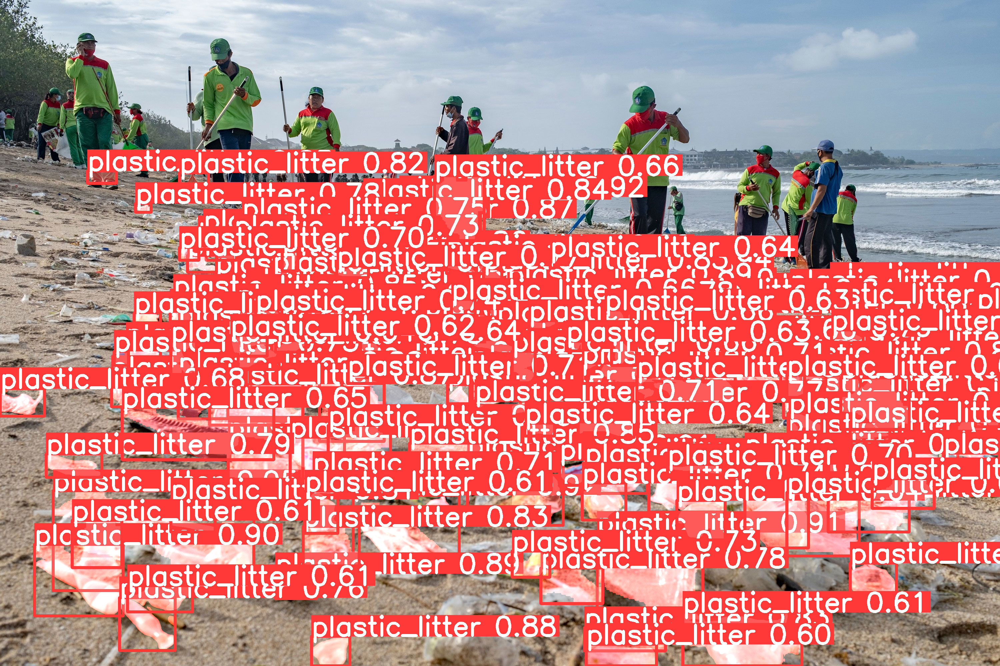

Processing beach2.jpg...
Performing prediction on 12 slices.
 -> Found 127 objects.
 -> Saved to: sahi_output/beach2.png


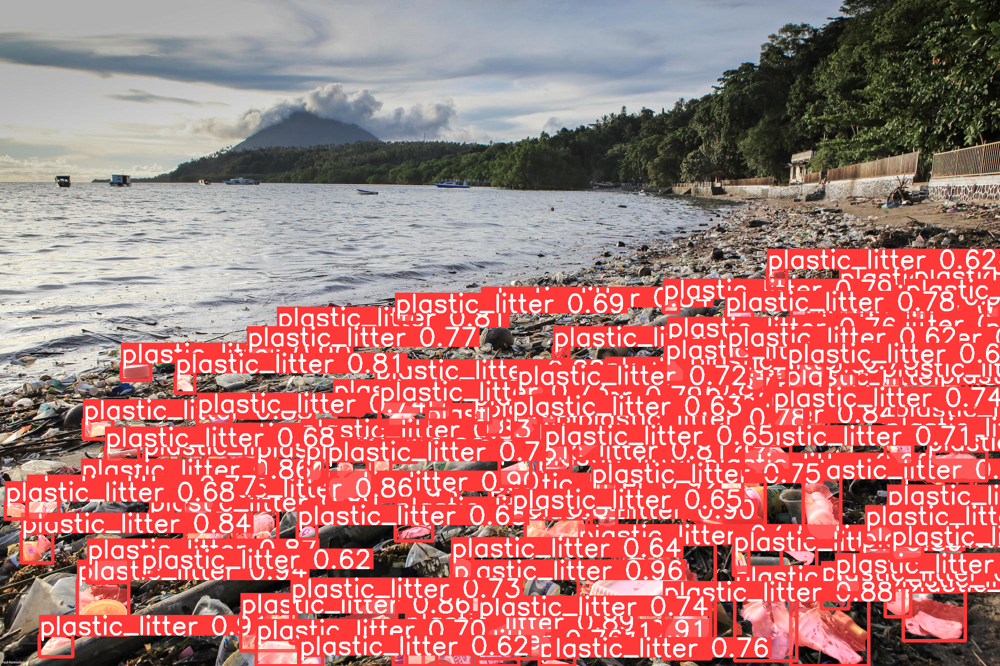

Processing beach3.jpg...
Performing prediction on 6 slices.
 -> Found 7 objects.
 -> Saved to: sahi_output/beach3.png


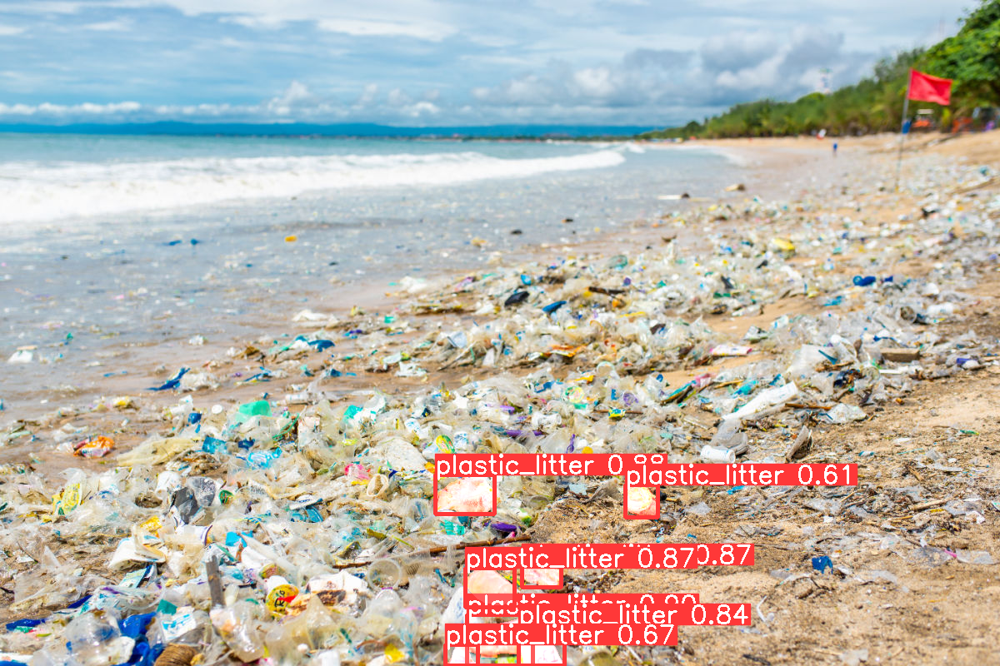

In [13]:
import os
from pathlib import Path
from sahi import AutoDetectionModel
from sahi.predict import get_sliced_prediction
from sahi.utils.cv import visualize_object_predictions
from IPython.display import Image, display

# 1. Setup
best_weights = 'runs/segment/11l-seg-sliced-640-p2/weights/best.pt'
image_files = ['beach1.jpg', 'beach2.jpg', 'beach3.jpg'] 
output_dir = "sahi_output"

os.makedirs(output_dir, exist_ok=True)

# 2. Load Model
detection_model = AutoDetectionModel.from_pretrained(
    model_type='yolo11', 
    model_path=best_weights,
    confidence_threshold=0.6, 
    device="xpu" 
)

for img_path in image_files:
    if not os.path.exists(img_path):
        print(f"Skipping {img_path}...")
        continue

    print(f"Processing {img_path}...")
    
    # 3. Sliced Prediction
    result = get_sliced_prediction(
        img_path,
        detection_model,
        slice_height=640,
        slice_width=640,
        overlap_height_ratio=0.2,
        overlap_width_ratio=0.2
    )
    
    # 4. Save to Disk (The Fix)
    # We export the visualization to a real file first.
    save_path = os.path.join(output_dir, Path(img_path).name)
    
    result.export_visuals(export_dir=output_dir, file_name=Path(img_path).stem)
    
    # Note: SAHI saves as {stem}.png, so we reconstruct the path
    saved_file_path = os.path.join(output_dir, Path(img_path).stem + ".png")
    
    print(f" -> Found {len(result.object_prediction_list)} objects.")
    print(f" -> Saved to: {saved_file_path}")

    # 5. Force Display in Notebook
    # This reads the file from disk and forces the notebook to show it
    display(Image(filename=saved_file_path))